## Final Product
**steps:**

* choose which species will be visualized

* segment layout into lobes

* generate clades into their lobe

[Science ToL](http://www.sciencemag.org/cgi/content/summary/300/5626/1691):
![](http://www.sciencemag.org/site/feature/data/tol/TOL_imap.jpg)

In [ ]:
from Bio import Phylo
import io
TopLevel='CellularLife(Bacteria,Archaea(Nanoarchaeota,(Euryarchaeota,(TACK(Koryarchaeota,(Aigarchaeota,(Thaumarchaeota,Crenarchaeota))),(Lokiarchaeota,Eukaryota(Excavata,(Chromista(SAR,AH),(Varisulca,Amorphea(Amoebozoa,Obazoa(Breviatea,(Apusonomadida,(Opisthokonta(Holozoa,Holomycota),Apusomonadida))))))))))))'
p=Phylo.parse(io.StringIO(TopLevel),'newick').__next__()
print(p)

In [ ]:
bacteria='Bacteria((Aquificae,Desulfurobacterium),((OP1,(Dictyoglomus,(Thermotogae,Coprothermobacter))),(Thermodesulfobacteria,(Deinococcus-Thermus,((Chloroflexi,((TM7,(SC3,(WS5,Guaymas1))),((ABY1,BD1-5),(OP11,WS6)))),((Spirochaetes,(Synergistes,Caldiserica)),                                 (((TM6,(Acidobacteria,(OS-K,OP8),(Elusimicrobia,Nitrospira))),(Proteobacteria,(SBR1093,(Chrysiogenes arsenatis,Deferribacteres))),FCB((Fibrobacteres,Gemmatimonadates),((Marine group A,Caldithrix),(Bacteroidetes,Chlorobi)))),(((Fusobacteria,(Cyanobacteria,(Firmicutes,OP9,WS2))),((SC4,Armatimonadetes),(NC10,Actinobacteria))),((NKB19,(WS3,BRC1)),PVC(Poribacteria,((Planctomycetes,OP3),(Chlamydiae,(Lentisphaerae,Verrucomicrobia)))))))))))))'
b=Phylo.parse(io.StringIO(bacteria),'newick').__next__()
print(b)

In [ ]:
def insert_string(string,find,replacement):
    return string[:string.find(find)]+replacement+string[string.find(find)+len(find):]
Tree=insert_string(TopLevel,'Bacteria',bacteria)
b=Phylo.parse(io.StringIO(Tree),'newick').__next__()
print(b)

this is bullshit

In [7]:
from Bio import Phylo
with open('/home/bwsq/Downloads/draftversion4.tre','r') as f:
    GiantFuckoffTree=Phylo.parse(f,'newick').__next__()
    

In [8]:
tree={}
duplicates={}
for clade in GiantFuckoffTree.find_clades():
        if clade.name:
            n=' '.join(clade.name.split('_')[:-1])
            if n in tree:
                if n in duplicates:
                    duplicates[n].append(clade)
                else:
                    duplicates[n]=[clade]
            else:
                tree[n]=clade

In [9]:
def _subclades(clade,depth):
    if clade.name:
        n=' '.join(clade.name.split('_')[:-1])
    else:
        n=None
    ret=Phylo.BaseTree.Clade(name=n,confidence=clade.count_terminals())
        
    if depth:
        for c in clade:
            ret.clades.append(_subclades(c,depth-1))
    return ret
def subclades(name,depth):
    ret=Phylo.BaseTree.Tree()
    ret.root.clades.append(_subclades(tree[name],depth))
    return ret
#print(subclades('Eukaryota',4))


amount of area i want to give to:
*    Bacteria 3  1/4 ---------- 297066
*    Archaea 1   1/12 ---------- 4072
*    protists 1  1/12 ---------- 2602
*    Plants 3    1/4 ----------- 343,441
*    Fungi 1     1/12 ---------- 309,631
*    Animals 3   1/4 ----------- 1,467,443
                           

if we take the protozoa as measure that gives
total species as

In [ ]:
2602*12 #( including 1000 amoebae)

we neeed to select 
+          2500 fungi  
+          2500 archaea  
+         7500 metazoa  
+         7500 plants  
+         7500 bacteria  

In [ ]:
fungi_tree=subclades('Fungi',4)
print(fungi_tree)


In [ ]:
dikarya=subclades('Division Dikarya',4)
print(dikarya)

In [ ]:
print(subclades('Saccharomycodes',4))

In [ ]:
fungi_suffices={'division':'mycota','subdivision':'mycotina','clade':'myceta','class':'mycetes','subclass':'mycetidae','order':'ales','family':'aceae'}
fungal_taxa={t:[] for t in fungi_suffices}
fungal_taxa['other']=[]
for clade in tree['Fungi'].find_clades():
    if clade.name:
        n=' '.join(clade.name.split('_')[:-1])
        for taxon in fungi_suffices:
            if n.endswith(fungi_suffices[taxon]):
                fungal_taxa[taxon].append(clade)
            else:
                fungal_taxa['other'].append(clade)

In [ ]:
[(i,len(fungal_taxa[i])) for i in fungal_taxa]

In [ ]:
fungal_taxa['class']

In [ ]:
fungal_species=tree['Fungi'].get_terminals()
fungal_species[234]

In [ ]:
fungal_genera=[]
for clade in tree['Fungi'].find_clades():
    if clade.is_preterminal():
        fungal_genera.append(clade)

In [ ]:
len(fungal_genera)

In [ ]:
bacterial_genera=[]
for clade in duplicates['Bacteria'][0].find_clades():
    if clade.is_preterminal():
        bacterial_genera.append(clade)
len(bacterial_genera)

In [ ]:
archaeal_genera=[]
for clade in duplicates['Archaea'][0].find_clades():
    if clade.is_preterminal():
        archaeal_genera.append(clade)
len(archaeal_genera)

In [ ]:
plant_genera=[]
for clade in 

In [ ]:
print(subclades('Eukaryota',4))

In [ ]:
corticata=tree['Eukaryota'][4][1][1]
corticata_genera=[]
for clade in corticata.find_clades():
    if clade.is_preterminal():
        corticata_genera.append(clade)
len(corticata_genera)

We need to make a nice tree filled with a carefully chosen subset of corticata genera

All corticate families should be represented.

In [ ]:
tree['Poaceae']

In [ ]:
corticate_suffices={'subkingdom':'plantae','division':'phyta','subdivision':'phytina','class':'phyceae','subclass':'phycidae','order':'ales','suborder':'ineae','family':'aceae','subfamily':'oideae','tribe':'eae'}
corticate_families=[]
for clade in corticata.find_clades():
    if clade.name:
        n=' '.join(clade.name.split('_')[:-1])
        if n.endswith('aceae'):
            corticate_families.append(clade)
len(corticate_families)

In [ ]:
corticate_subfamilies=[]
for clade in corticata.find_clades():
    if clade.name:
        n=' '.join(clade.name.split('_')[:-1])
        if n.endswith('ideae'):
            corticate_subfamilies.append(clade)
len(corticate_subfamilies)

In [ ]:
True and (True if 0==0 else False)

In [ ]:
corticate_above_genera=[]
for clade in corticata.find_clades():
    subs=clade.clades
    if len(subs)==0:#species
        pass
    else:
        all_subs_are_genera=True
        for sub in subs:
            all_subs_are_genera=all_subs_are_genera and (True if sub.is_preterminal() else False)
        if all_subs_are_genera:
            corticate_above_genera.append(clade)
len(corticate_above_genera)

In [ ]:
metazoan_above_genera=[]
for clade in tree['Metazoa'].find_clades():
    subs=clade.clades
    if len(subs)==0:#species
        pass
    else:
        all_subs_are_genera=True
        for sub in subs:
            all_subs_are_genera=all_subs_are_genera and (True if sub.is_preterminal() else False)
        if all_subs_are_genera:
            metazoan_above_genera.append(clade)
len(metazoan_above_genera)

In [ ]:
metazoan_families=[]
for clade in tree['Metazoa'].find_clades():
    if clade.name:
        n=' '.join(clade.name.split('_')[:-1])
        if n.endswith('idae'):
            metazoan_families.append(clade)
len(metazoan_families)

In [ ]:
protist_clades=['Picozoa','Apusozoa','Excavata','Amoebozoa','Centrohelida','Corallochytrea','Ichthyosporea','Filasterea','Choanomonada']
protist_genera=[]
for cladename in protist_clades:
    for clade in tree[cladename].find_clades():
        if clade.is_preterminal():
            protist_genera.append(clade)
len(protist_genera)

well, i guess we'll see.

next step: layout

In [ ]:
import svgwrite
layout=svgwrite.Drawing(size=(400,400))

g=layout.g()
g.translate(200,200)

g.add(layout.circle(center=(0,0),r=180,fill='none',stroke_width=3,stroke='red'))
g.add(layout.circle(center=(0,0),r=50,fill='none',stroke_width=1,stroke='aqua'))
layout.add(g)
from IPython.display import SVG
SVG(layout.tostring())

here's the workflow:
generate a tree with the right nodes and connections.
fiddle with it in inkscape
then generate the threads.

In [10]:
testtree=subclades('Eukaryota',5)

In [182]:
for clade in testtree.find_clades():
    subs=[]
    for sub in clade.clades:
        if sub.confidence>1:
            subs.append(sub)
    clade.clades=subs


Tree(rooted=True)
    Clade()
        Clade(confidence=2123117, name='Eukaryota')
            Clade(confidence=1777230, name='Opisthokonta')
                Clade(confidence=1467568, name='Holozoa')
                    Clade(confidence=3, name='Corallochytrea')
                        Clade(confidence=3, name='Corallochytrida')
                            Clade(confidence=3, name='Corallochytridae')
                    Clade(confidence=62)
                        Clade(confidence=58, name='Ichthyosporea')
                            Clade(confidence=14, name='Dermocystida')
                            Clade(confidence=44, name='Ichthyophonae')
                        Clade(confidence=4, name='Filasterea')
                            Clade(confidence=4, name='Ministeriida')
                    Clade(confidence=1467503)
                        Clade(confidence=60, name='Choanomonada')
                            Clade(confidence=37, name='Craspedida')
                            Clade(co

In [238]:
for c in testtree.find_clades(order='level'):
    print(c.__repr__())

Clade()
Clade(confidence=2123117, name='Eukaryota')
Clade(confidence=1777230, name='Opisthokonta')
Clade(confidence=42, name='Centrohelida')
Clade(confidence=345835)
Clade(confidence=3, name='Apusozoa')
Clade(confidence=3, name='Picozoa')
Clade(confidence=1467568, name='Holozoa')
Clade(confidence=309661, name='Nucletmycea')
Clade(confidence=28, name='Acanthocystidae')
Clade(confidence=4, name='Raphidiophryidae')
Clade(confidence=6, name='Heterophryidae')
Clade(confidence=1041, name='Amoebozoa')
Clade(confidence=344794)
Clade(confidence=3, name='Collodictyonidae')
Clade(confidence=3, name='Picomonadea')
Clade(confidence=3, name='Corallochytrea')
Clade(confidence=62)
Clade(confidence=1467503)
Clade(confidence=28, name='Discicristoidea')
Clade(confidence=309631, name='Fungi')
Clade(confidence=7, name='Pterocystis')
Clade(confidence=2, name='Raineriophrys')
Clade(confidence=15, name='Acanthocystis')
Clade(confidence=4, name='Choanocystis')
Clade(confidence=3, name='Raphidiophrys')
Clade(co

In [185]:
from itertools import zip_longest
def make_binary(tree):
    for clade in tree.find_clades(order='postorder'):
        if len(clade.clades)==1:
            #tree.collapse(clade.clades[0])
            clade.clades=clade.clades[0].clades
        else:
            while len(clade.clades)>2:
                clade.clades=[Phylo.BaseTree.Clade(clades=list(i)) if i[1] else i[0] for i in zip_longest(clade.clades[::2],clade.clades[1::2])]
#make_binary(testtree)
print(testtree)


Tree(rooted=True)
    Clade()
        Clade(confidence=2123117, name='Eukaryota')
            Clade(confidence=1777230, name='Opisthokonta')
                Clade(confidence=1467568, name='Holozoa')
                    Clade(confidence=3, name='Corallochytrea')
                        Clade(confidence=3, name='Corallochytrida')
                            Clade(confidence=3, name='Corallochytridae')
                    Clade(confidence=62)
                        Clade(confidence=58, name='Ichthyosporea')
                            Clade(confidence=14, name='Dermocystida')
                            Clade(confidence=44, name='Ichthyophonae')
                        Clade(confidence=4, name='Filasterea')
                            Clade(confidence=4, name='Ministeriida')
                    Clade(confidence=1467503)
                        Clade(confidence=60, name='Choanomonada')
                            Clade(confidence=37, name='Craspedida')
                            Clade(co

In [259]:
depths=testtree.depths(unit_branch_lengths=True)
#for t in testtree.find_clades(order='postorder',terminal=False):
    #we are some distance from the root(depth 1)
def placetree(terminalpositions,rootposition,tree):
    terms=tree.get_terminals()
    if len(terminalpositions)!=len(terms):
        raise IndexError('need'+str(len(terms))+'terminal positions, only got '+str(len(terminalpositions)))
    depths=tree.depths(unit_branch_lengths=True)
    pos={}
    termpos=iter(terminalpositions)
    for t in terms:
        pos[t]=next(termpos)
    for t in reversed(list(tree.find_clades(order='level'))):
        p=tree.get_path(t)
        if len(p)<=1:
            parent=tree.root
        else:
            parent=p[-2]
        if parent not in pos:
            siblings=parent.clades
            centroid=sum(pos[s] for s in siblings)*(1/len(siblings))
            ray=rootposition-centroid
            pos[parent]=ray*(1/depths[t])+centroid
    return pos
            
len(testtree.get_terminals())

69

In [258]:
l=list(testtree.find_clades(order='level'))
l.reverse()
testtree.get_path(l[-2])

[Clade(confidence=2123117, name='Eukaryota')]

In [267]:
from generate import metatree,Branch
width=4000
height=4000

t1=radians(-29)
t2=radians(75)

dwg=svgwrite.Drawing(size=(width,height))

start=Vec2D(width*0.6,height*0.6)
Trees=[]

x=[4]*(69)

#or just split it up reasonably equally, and connect the dots.
#20+18+24+18+22+29=26ish.
#we could do five domains: animals, fungi, plants, protists, and bacteria?

theta=Branch(Branch(0.68+random()*0.05,0.83+random()*0.05),Branch(1.05,0.75+random()*0.25))
length=Branch(0.79+random()*0.02,0.63+random()*0.07)
m=metatree(start,x,50,Branch(t1+radians(randint(-3,3)),t2+radians(randint(-5,5))),theta,length,render=False)




for t in m['trees']:
    dwg.add(t)
    
terminalpositions= [Vec2D(*(float(s) for s in t['transform'][7:-1].split(',')[1:])) for t in m['trees']]

poss=placetree(terminalpositions,start,testtree)
for c in testtree.find_clades(terminal=False):
    g=dwg.g(id=c.name)
    for sub in c.clades:
        l=dwg.line(poss[c].car,poss[sub].car,stroke='green',stroke_width=10)
        g.add(l)
    g.add(dwg.circle(poss[c].car,r=10,fill='red',id=hex(id(c)))
    
    dwg.add(g)
#for l in m['lines']:
#    dwg.add(l)

#self.dwg.add(svgwrite.text.Text('TreeDensity:'+str(self.density),insert=(50,500),font_size=30,stroke='black'))
#self.dwg.add(svgwrite.text.Text('TreeDepth:'+str(self._depth),insert=(50,550),font_size=30,stroke='black'))
#self.dwg.add(svgwrite.text.Text('LineMult:'+str(self.length),insert=(50,500),font_size=30,stroke='black'))
#self.dwg.add(svgwrite.text.Text('ThetaMul:'+str(self.theta),insert=(50,550),font_size=30,stroke='black'))
SVG(dwg.tostring())

In [321]:
m['trees'][3]['transform']
tfmlist=[(j[0],tuple(float(s) for s in j[1].split(','))) for j in [i.split('(') for i in m['trees'][3]['transform'].split(')')[:-1]]]
#[i[0] for i in l].index(' translate')
ret=[]
for i in tfmlist:
    ret.append('('.join((i[0],','.join(str(s) for s in i[1]))))
')'.join(ret+[''])
#'('.join(tfmlist[0],','.join(str(s) for s in tfmlist[1]))
#m['trees'][0]['transform'].split(') ')

'rotate(-37.38536141916196,1369.4470993653579,1414.974686461731)'

In [4]:
def area(path):
    """ convert path described by a list of beziers to a polygon,and calculate the area of that poly"""
    numpoints=1000
    points=[path(s/numpoints) for s in range(numpoints)]
    
    #close the path
    points.append(path(0))
    return poly_area(points)

def poly_area(points):
    area=0
    l=len(points)
    for i in range(l):
        p1=points[i]
        p2=points[(i+l-1)%l]
        area+=(p2.x+p1.x)*(p2.y-p1.y)
    return abs(area/2)

from vec2d import Vec2D
from scipy.special import binom
import math
def bez_path(coefs):
    order=len(coefs)-1
    for i in range(len(coefs)):
        if type(coefs[i])!=Vec2D:
            coefs[i]=Vec2D(*coefs[i])
    def path(t):
        pathpoint=sum(binom(order,idx)*c*(1-t)**(order-idx)*t**idx for idx,c in enumerate(coefs))
        #deriv=(order)*sum(binom(order-1,idx)*(coefs[idx+1]-coefs[idx])*(1-t)**(order-1-idx)*t**idx for idx in range(len(coefs)-1))
        return pathpoint#,deriv
    return path

def bez_list_path(bezlist):#naively assumes all paths are the same length
    subpaths=[bez_path(c) for c in bezlist]
    order=len(bezlist)
    def path(t):
        t=t*order#0->0,1/3->1, 1->3
        s,t=int(t),t-int(t)
        if s==order:
            s=order-1
            t=1
        return subpaths[s](t)
    return path

we have a graph. the root goes whereever, and has an area to feed.

now we know how much area each of the children need. so we need to choose which direction  
their branches point.

given a line extending along the parent direction, that splits the area into two parts, and gives us an area ratio

In [5]:
theta,lengthfrom random import gauss
def get_branching_endpoint(s0,q0,area_poly,goal_ratio):

    #thetas=[(area_poly[(s0+i)%len(area_poly)]-q0).t for i in range(1,len(area_poly))]


    
    l=list(range(len(area_poly)))
    l.pop(s0)
    '''if s0==0:
        l.pop(-1)
        l.pop(0)
        l.pop(0)
    elif s0==len(area_poly)-1:
        l.pop(s0-1)
        l.pop(s0-1)
        l.pop(0)
    else:
        l.pop(s0-1)
        l.pop(s0-1)
        l.pop(s0-1)'''

    ratios=[]
    for s1 in l:    
        if s1>s0:
            poly1=[q0]+area_poly[s0:s1]+[area_poly[s1]+k/5*(q0+(-1)*area_poly[s1]) for k in range(6)]
            poly2=[q0+k/5*(area_poly[s1]+(-1)*q0) for k in range(1,6)]+area_poly[s1:]+area_poly[:s0+1]+[q0]
        elif s1==s0:
            assert(False)#should never happen
        else:
            poly1=[q0]+area_poly[s0:]+area_poly[:s1]+[area_poly[s1]+k/5*(q0+(-1)*area_poly[s1]) for k in range(6)]
            poly2=[q0+k/5*(area_poly[s1]+(-1)*q0) for k in range(1,6)]+area_poly[s1:s0+1]+[q0]
        pp=(poly_area(poly1),poly_area(poly2))
        if pp[0]>1e-10 and pp[1]>1e-10:
            ratios.append((pp[0]/sum(pp),s1,poly1,poly2,pp[0]/sum(pp)))
    if len(ratios)==0:
        print("NO NONZERO AREAS",([p.car for p in area_poly],q0.car,area_poly[s0].car))
        raise IndexError
    ratios.sort()
    #goal_ratio will be in between 2 of these,we hope
    i=0
    while goal_ratio>ratios[i][0]:
        if i==len(ratios)-1:
            break
        i+=1

    ret=ratios[i][1:]
    
    #subdivide poly
    def subdiv(pol):
        for i in range(len(pol)-1):
            if pol[i]==pol[i+1]:
                pass
            else:
                yield pol[i]
                yield (pol[i]+pol[i+1])*0.5
        yield pol[-1]
    
    s1=ratios[i][1]
    r=ratios[i][-1]
    poly1 = list(subdiv(ratios[i][2]))
    poly2 = list(subdiv(ratios[i][3]))
    return s1,poly1,poly2,r

from collections import namedtuple
Rect=namedtuple('Rect',('x0','y0','x1','y1'))
def lineintersect(r1,r2):
    if r1.x1==r1.x0:
        #vertical r1.
        x=r1.x0
        if r2.x1==r2.x0:#parallel, possibly colinear
                if r2.x1==r1.x1:
                    y=sorted([r1.y0,r1.y1,r2.y0,r2.y1])
                    return x,(y[1]+y[2])/2
                else:
                    return False
        b=(r2.y1-r2.y0)/(r2.x1-r2.x0)
        return x,b*(x-r2.x0)+r2.y0

    a=(r1.y1-r1.y0)/(r1.x1-r1.x0)

    if r2.x1==r2.x0:#vertical r2
        x=r2.x0
        return x,a*(x-r1.x0)+r1.y0

    b=(r2.y1-r2.y0)/(r2.x1-r2.x0)

    if a==b:#colinear (parallel) lines. return midpoint of overlap? if they overlap, that is.
        if a*(r2.x0-r1.x0)+r1.y0==r2.y0: #colinear.
            x=sorted([r1.x0,r1.x1,r2.x0,r2.x1])
            y=sorted([r1.y0,r1.y1,r2.y0,r2.y1])
            return ((x[1]+x[2])/2,(y[1]+y[2])/2)
        else:
            return False
    x=(r2.y0-r1.y0-b*r2.x0+a*r1.x0)/(a-b)
    return x,a*(x-r1.x0)+r1.y0

def intersection(polypoints,q0,theta):

    #set length of intersecting line to larger than the diagonal of the bounding box
    x,y=zip(*[p.car for p in polypoints])
    bigenough=math.sqrt((max(x)-min(x))**2+(max(y)-min(y))**2)
    q1=q0+Vec2D(r=bigenough,t=theta)

    def overlaps(p1,p2,q1,q2):
        if min(p1.x,p2.x)<max(q1.x,q2.x) and max(p1.x,p2.x)>min(q1.x,q2.x) and min(p2.y,p1.y)<max(q1.y,q2.y) and max(p1.y,p2.y)>min(q1.y,q2.y):
            return True
        return False

    intersections=[]
    for i in range(len(polypoints)):
        p0=polypoints[i]
        p1=polypoints[(i+1)%len(polypoints)]
        if overlaps(p0,p1,q0,q1):
            li=Vec2D(*lineintersect(Rect(*(p0.car+p1.car)),Rect(*(q0.car+q1.car))))

            #the intersection in terms of where on the perimeter, as well as the x,y coord
            intersections.append((i,li))

    if len(intersections)==0:
        #print('NO INTERSECTIONGS')
        #print('HOW EVEN POAAABLE?!')
        #print([p.car for p in polypoints],q0,q1)
        raise ValueError
    if len(intersections)>1:
        #assume it's the intersection closest to q0(but not q0 itself)
        d=sorted([((i[1]+(-1)*q0).r,i) for i in intersections])
        if abs(d[0][0])>=1e-10:#sanity check
            return d[0][1]
        else:
            return d[1][1]
    if abs((intersections[0][1]+(-1)*q0).r)<=1e-10:
        print("NO NONZERO INTERSECTIONS CRYING NOW")
        raise ValueError
    return intersections[0][0]
        
def layout(ratio,area_poly,s0,branchlen,branchtheta,diameter):
    
    #say it's dichotomous. for simples
    
    '''one=node.clades[0]
    two=node.clades[1]
    if one.confidence>two.confidence:
        one,two=two,one
    ratio=one.confidence/(one.confidence+two.confidence)
    '''
    
    q0=area_poly[s0]+Vec2D(r=branchlen,t=branchtheta)
    try:
        s1,poly1,poly2,r=get_branching_endpoint(s0,q0,area_poly,ratio)
    except IndexError as e:
        print('tried branching,',s0,q0,area_poly,ratio)
        raise e
    
    """NOw....
    """
    #Rule 5
    N=2.8    
    diameter_one=diameter*r**(1/N)
    diameter_two=diameter*(1-r)**(1/N)
    


    dividingline=(area_poly[s1]+(-1)*q0).t
    #Rule 6
    theta_one=dividingline+math.acos((1+r**(4/N)-(1-r)**(4/N))/(2*r**(2/N)))
    theta_two=dividingline-math.acos((1+(1-r)**(4/N)-r**(4/N))/(2*(1-r)**(2/N)))
    #print(theta_one,theta_two,dividingline)
    length_one=3*diameter_one
    length_two=3*diameter_two

    #rule 4a ignored
    
    #rule 6a:
    phi_one=get_branching_endpoint(0,poly1[0],poly1,0.5)[0]#or perhaps to min(child[0].confidence,child[1].confidence)/sum(child[0].confidence,child[1].confidence)
    phi_two=get_branching_endpoint(len(poly2)-1,poly2[-1],poly2,0.5)[0]
    phi_one=(poly1[phi_one]-poly1[0]).t
    phi_two=(poly2[phi_two]-poly2[-1]).t
    #print(phi_one,phi_two)
    
    '''if theta_one<phi_one:
        theta_one=(theta_one+phi_one)/2# max(  ,math.pi/2)
    if theta_two<phi_two:
        theta_two=(theta_two+phi_two)/2'''

    #rule 7a:
    try:
        distance_one=(intersection(poly1,q0,theta_one)[1]+(-1)*q0).r
        distance_two=(intersection(poly2,q0,theta_two)[1]+(-1)*q0).r
    
    #dist/(6diam)<m<dist/(3*diam)
    #len=m*diam  dist/(m*diam)>6  dist/diam>6m m<dist/diam/6
    
        if length_one>distance_one/3:
            length_one=distance_one/3
        if length_one<distance_one/6:
            length_one=distance_one/6

        if length_two>distance_two/3:
            length_two=distance_two/3
        if length_two<distance_two/6:
            length_two=distance_two/6
    except ValueError:
        pass
    return ({'length':length_one,'diameter':diameter_one,'theta':theta_one,'area':poly1,'branchpoint':0},
           {'length':length_two,'diameter':diameter_two,'theta':theta_two,'area':poly2,'branchpoint':len(poly2)-1})



In [6]:
import svgwrite
poly=[Vec2D(r=50,t=i/50*2*math.pi) for i in range(50,-1,-1)]
dwg=svgwrite.Drawing()
g=dwg.g()
g.add(dwg.circle(r=50,center=(0,0),fill='none',stroke='black',stroke_width=1))
g.add(dwg.line(poly[0].car,(poly[0]+Vec2D(r=10,t=math.pi)).car,stroke='red',stroke_width=1))
cdict={testtree.root:{'area':poly,'branchpoint':0,'theta':math.pi,'length':10,'diameter':3}}
for clade in testtree.find_clades(order='preorder'):
    this=cdict[clade]
    if this==None:
        for c in clade.clades:
            cdict[c]=None
    else:
        if len(clade.clades)==2:
            ratio=tuple(clade.clades[i].confidence for i in [0,1])
            ratio=min(ratio)/sum(ratio)
            if ratio==0:
                print('WTF',clade.clades[0].confidence,clade.clades[1].confidence)
                raise ValueError
        else:
            ratio=0.5
        toosmall=False
        try:
            left,right=layout(ratio,this['area'],this['branchpoint'],this['length'],this['theta'],this['diameter'])
        except (IndexError,ValueError):
            toosmall=True
        if not toosmall:
            if clade.clades:
                if clade.clades[0].confidence<clade.clades[1].confidence:
                    cdict[clade.clades[0]]=left
                    cdict[clade.clades[1]]=right
                else:
                    cdict[clade.clades[1]]=left
                    cdict[clade.clades[0]]=right
            g.add(dwg.line((this['area'][this['branchpoint']]+Vec2D(r=this['length'],t=this['theta'])).car,(left['area'][left['branchpoint']]+Vec2D(r=left['length'],t=left['theta'])).car,stroke='blue',stroke_width=left['diameter'],id='left'))
            g.add(dwg.line((this['area'][this['branchpoint']]+Vec2D(r=this['length'],t=this['theta'])).car,(right['area'][right['branchpoint']]+Vec2D(r=right['length'],t=right['theta'])).car,stroke='green',stroke_width=right['diameter'],id='right'))
        else:
            for c in clade.clades:
                cdict[c]=None
            
g.translate(60,60)
#g.scale(10)
dwg.add(g)
from IPython.display import SVG
SVG(dwg.tostring())

NameError: name 'testtree' is not defined

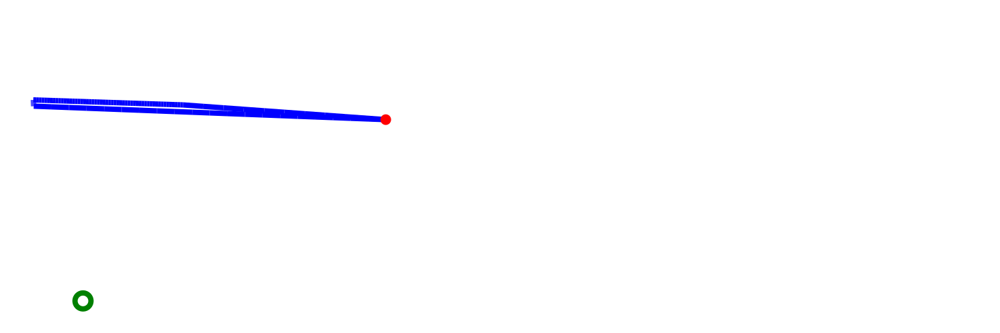

In [131]:
#poly,q0,q1=([(43.433800601973864, -21.67891533457719), (21.716900300986932, 14.111210543418192), (3.1086244689504383e-15, 49.901336421413575), (4.34338006019739, 42.743311245814496), (8.686760120394776, 35.585286070215425), (13.030140180592163, 28.427260894616346), (17.37352024078955, 21.26923571901727), (21.716900300986936, 14.111210543418197), (26.060280361184322, 6.953185367819124), (30.40366042138171, -0.2048398077799547), (34.74704048157909, -7.362864983379033), (39.09042054177648, -14.520890158978109), (43.433800601973864, -21.678915334577184)],(43.433800601973864,-21.67891533457719),(-28.14645115401691,-65.11271593655104))
poly,q0,q1=([(8.47870497039169, 3.151798961795825), (4.677825345424193, 2.8753155491943083), (0.8769457204566962, 2.598832136592792), (-2.9239339045108004, 2.3223487239912757), (-6.724813529478297, 2.045865311389759), (-10.525693154445793, 1.7693818987882424), (-14.32657277941329, 1.4928984861867258), (-18.127452404380787, 1.2164150735852093), (-21.928332029348283, 0.9399316609836927), (-21.928332029348283, 0.9399316609836927), (-21.928332029348283, 0.9399316609836927), (-22.448177732508498, 0.9225255191136245), (-22.968023435668716, 0.9051193772435562), (-23.487869138828934, 0.8877132353734879), (-24.00771484198915, 0.8703070935034196), (-24.527560545149367, 0.8529009516333513), (-25.047406248309585, 0.835494809763283), (-25.567251951469803, 0.8180886678932148), (-26.08709765463002, 0.8006825260231465), (-26.606943357790236, 0.7832763841530782), (-27.126789060950454, 0.7658702422830099), (-27.646634764110672, 0.7484641004129416), (-28.166480467270887, 0.7310579585428734), (-28.686326170431105, 0.7136518166728052), (-29.206171873591323, 0.6962456748027369), (-29.72601757675154, 0.6788395329326686), (-30.24586327991176, 0.6614333910626005), (-30.765708983071974, 0.6440272491925322), (-31.285554686232192, 0.6266211073224639), (-31.80540038939241, 0.6092149654523956), (-32.325246092552625, 0.5918088235823273), (-32.84509179571285, 0.5744026817122591), (-33.36493749887306, 0.5569965398421908), (-33.884783202033276, 0.5395903979721225), (-34.40462890519349, 0.5221842561020542), (-34.924474608353705, 0.5047781142319859), (-35.44432031151393, 0.4873719723619177), (-35.96416601467415, 0.4699658304918495), (-36.48401171783436, 0.4525596886217812), (-37.00385742099458, 0.4351535467517129), (-37.52370312415479, 0.41774740488164464), (-38.04354882731501, 0.40034126301157635), (-38.56339453047523, 0.3829351211415081), (-39.08324023363545, 0.3655289792714398), (-39.603085936795665, 0.34812283740137157), (-40.12293163995588, 0.33071669553130334), (-40.642777343116094, 0.31331055366123506), (-41.16262304627631, 0.2959044117911668), (-41.68246874943653, 0.2784982699210985), (-42.20231445259675, 0.2610921280510302), (-42.72216015575697, 0.24368598618096196), (-43.24200585891718, 0.2262798443108937), (-43.761851562077396, 0.20887370244082543), (-44.28169726523761, 0.19146756057075714), (-44.80154296839783, 0.1740614187006889), (-45.321388671558054, 0.15665527683062064), (-45.84123437471827, 0.13924913496055236), (-46.36108007787848, 0.12184299309048409), (-46.8809257810387, 0.10443685122041582), (-47.40077148419891, 0.08703070935034755), (-47.920617187359134, 0.06962456748027929), (-48.440462890519356, 0.05221842561021102), (-48.96030859367957, 0.03481228374014275), (-49.480154296839785, 0.017406141870074485), (-50.0, 6.217248937900877e-15), (-50.0, 6.214310970958248e-15), (-50.0, 6.21137300401562e-15), (-50.0, 6.208435037072992e-15), (-50.0, 6.205497070130363e-15), (-50.0, 6.2025591031877346e-15), (-50.0, 6.199621136245106e-15), (-50.0, 6.196683169302477e-15), (-50.0, 6.193745202359849e-15), (-50.0, 6.190807235417221e-15), (-50.0, 6.1878692684745925e-15), (-50.0, 6.184931301531964e-15), (-50.0, 6.181993334589335e-15), (-50.0, 6.179055367646706e-15), (-50.0, 6.1761174007040784e-15), (-50.0, 6.1731794337614505e-15), (-50.0, 6.170241466818822e-15), (-50.0, 6.167303499876193e-15), (-50.0, 6.164365532933564e-15), (-50.0, 6.1614275659909356e-15), (-50.0, 6.158489599048308e-15), (-50.0, 6.15555163210568e-15), (-50.0, 6.152613665163051e-15), (-50.0, 6.149675698220422e-15), (-50.0, 6.1467377312777935e-15), (-50.0, 6.143799764335165e-15), (-50.0, 6.140861797392537e-15), (-50.0, 6.137923830449909e-15), (-50.0, 6.13498586350728e-15), (-50.0, 6.1320478965646515e-15), (-50.0, 6.129109929622023e-15), (-50.0, 6.126171962679394e-15), (-50.0, 6.123233995736766e-15), (-49.99691980520097, 0.04895829436106254), (-49.993839610401935, 0.09791658872211896), (-49.9907594156029, 0.14687488308317537), (-49.98767922080387, 0.1958331774442318), (-49.98459902600484, 0.2447914718052882), (-49.981518831205804, 0.29374976616634463), (-49.97843863640677, 0.34270806052740105), (-49.97535844160774, 0.39166635488845747), (-49.972278246808706, 0.4406246492495139), (-49.96919805200967, 0.4895829436105703), (-49.96611785721064, 0.5385412379716268), (-49.96303766241161, 0.5874995323326831), (-49.959957467612575, 0.6364578266937395), (-49.95687727281354, 0.685416121054796), (-49.95379707801452, 0.7343744154158525), (-49.950716883215485, 0.7833327097769088), (-49.94763668841645, 0.8322910041379652), (-49.944556493617426, 0.8812492984990217), (-49.941476298818394, 0.930207592860078), (-49.93839610401936, 0.9791658872211344), (-49.93531590922033, 1.0281241815821909), (-49.932235714421296, 1.0770824759432474), (-49.92915551962226, 1.1260407703043036), (-49.92607532482323, 1.17499906466536), (-46.62574834756573, 1.301487400782035), (-43.32542137030824, 1.42797573689871), (-40.02509439305075, 1.554464073015385), (-36.72476741579325, 1.6809524091320598), (-33.424440438535754, 1.8074407452487349), (-30.12411346127826, 1.9339290813654098), (-26.823786484020765, 2.0604174174820846), (-23.523459506763267, 2.1869057535987597), (-20.223132529505772, 2.313394089715435), (-16.922805552248278, 2.4398824258321095), (-13.622478574990783, 2.566370761948784), (-10.322151597733288, 2.692859098065459), (-7.021824620475792, 2.8193474341821343), (-3.721497643218296, 2.945835770298809), (-0.42117066596079944, 3.0723241064154836), (2.879156311296697, 3.1988124425321587), (6.1794832885541915, 3.3253007786488338), (9.479810265811686, 3.4517891147655084), (12.78013724306918, 3.578277450882183), (16.080464220326675, 3.704765786998858), (16.08046422032668, 3.704765786998858), (16.080464220326682, 3.704765786998858), (16.080464220326682, 3.704765786998858), (16.080464220326682, 3.704765786998858)] ,(16.080464220326682,3.704765786998858),(-40.68777109930039,37.7300578475505))
dwg=svgwrite.Drawing(size=(1500,500))
g=dwg.g()
for i in range(len(poly)-1):
    g.add(dwg.line(poly[i],poly[i+1],stroke='blue',stroke_width=1))
g.add(dwg.line(poly[-1],poly[0],stroke='blue',stroke_width=1))
#g.add(dwg.line(q0,q1,stroke='red',stroke_width=1))
g.add(dwg.circle(q0,r=1,fill='red'))
g.add(dwg.circle(q1,r=1.5,fill='none',stroke='green'))
g.translate(450,150)
g.scale(8)
dwg.add(g)
SVG(dwg.tostring())

In [121]:

def get_branching_endpoint(s0,q0,area_poly,goal_ratio):

    #thetas=[(area_poly[(s0+i)%len(area_poly)]-q0).t for i in range(1,len(area_poly))]


    
    l=list(range(len(area_poly)))
    l.pop(s0)
    '''if s0==0:
        l.pop(-1)
        l.pop(0)
        l.pop(0)
    elif s0==len(area_poly)-1:
        l.pop(s0-1)
        l.pop(s0-1)
        l.pop(0)
    else:
        l.pop(s0-1)
        l.pop(s0-1)
        l.pop(s0-1)'''

    ratios=[]
    for s1 in l:    
        if s1>s0:
            poly1=[q0]+area_poly[s0:s1]+[area_poly[s1]+k/5*(q0+(-1)*area_poly[s1]) for k in range(6)]
            poly2=[q0+k/5*(area_poly[s1]+(-1)*q0) for k in range(1,6)]+area_poly[s1:]+area_poly[:s0+1]+[q0]
        elif s1==s0:
            assert(False)#should never happen
        else:
            poly1=[q0]+area_poly[s0:]+area_poly[:s1]+[area_poly[s1]+k/5*(q0+(-1)*area_poly[s1]) for k in range(6)]
            poly2=[q0+k/5*(area_poly[s1]+(-1)*q0) for k in range(1,6)]+area_poly[s1:s0+1]+[q0]
        pp=(poly_area(poly1),poly_area(poly2))
        if pp[0]>1e-10 and pp[1]>1e-10:
            ratios.append((pp[0]/sum(pp),s1,poly1,poly2,pp[0]/sum(pp)))
    if len(ratios)==0:
        print("NO NONZERO AREAS",([p.car for p in area_poly],q0.car,area_poly[s0].car))
        raise IndexError
    ratios.sort()
    #goal_ratio will be in between 2 of these,we hope
    i=0
    while goal_ratio>ratios[i][0]:
        if i==len(ratios)-1:
            break
        i+=1

    ret=ratios[i][1:]
    
    #subdivide poly
    def subdiv(pol):
        for i in range(len(pol)-1):
            yield pol[i]
            yield (pol[i]+pol[i+1])*0.5
        yield pol[-1]
    
    s1=ratios[i][1]
    r=ratios[i][-1]
    poly1 = list(subdiv(ratios[i][2]))
    poly2 = list(subdiv(ratios[i][3]))
    return s1,poly1,poly2,r
vpoly=[Vec2D(*p)for p in poly]
get_branching_endpoint(len(vpoly)-2,Vec2D(*q0),vpoly,0.5)

(53,
 [Vec2D(x=45.0,y=-1.1634144591899855e-14),
  Vec2D(x=45.0,y=-1.1634144591899855e-14),
  Vec2D(x=45.0,y=-1.1634144591899855e-14),
  Vec2D(x=42.5,y=-1.1327982892113017e-14),
  Vec2D(x=40.0,y=-1.1021821192326179e-14),
  Vec2D(x=40.38153340021932,y=-2.4087683705085863),
  Vec2D(x=40.76306680043864,y=-4.817536741017162),
  Vec2D(x=40.9538335005483,y=-6.02192092627145),
  Vec2D(x=41.144600200657955,y=-7.226305111525738),
  Vec2D(x=41.33536690076761,y=-8.430689296780026),
  Vec2D(x=41.52613360087727,y=-9.635073482034313),
  Vec2D(x=41.716900300986936,y=-10.8394576672886),
  Vec2D(x=41.90766700109659,y=-12.043841852542888),
  Vec2D(x=42.09843370120625,y=-13.248226037797176),
  Vec2D(x=42.28920040131591,y=-14.452610223051463),
  Vec2D(x=42.47996710142557,y=-15.656994408305753),
  Vec2D(x=42.67073380153523,y=-16.86137859356004),
  Vec2D(x=42.86150050164488,y=-18.065762778814328),
  Vec2D(x=43.052267201754546,y=-19.270146964068616),
  Vec2D(x=43.24303390186421,y=-20.474531149322903),
  Vec2D

In [ ]:
get_branching_endpoint(0,Vec2D(0,0),poly,0.5)

[[[428.0, 133.0], [365.0, 193.0], [364.0, 195.0], [366.0, 262.0], [355.0, 254.0], [370.0, 146.0], [367.0, 142.0], [360.0, 142.0], [357.0, 144.0], [323.0, 232.0], [301.0, 216.0], [267.0, 96.0]]]


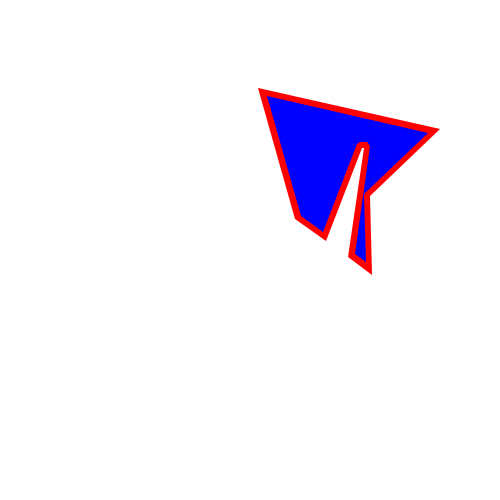

In [49]:
from pyclipper import *
from IPython.display import SVG
subj=( (348,257) ,(364,148) , (362,148),(326,241),(295,219),(258,88),(440,129),(370,196),(372,275))
pc=PyclipperOffset()
pc.AddPath(subj,JT_SQUARE,ET_CLOSEDPOLYGON)
soln=pc.Execute(-6)
dwg=svgwrite.Drawing(size=(500,500))
dwg.add(dwg.polygon(subj,fill='red'))
for s in soln:
    dwg.add(dwg.polygon(s,fill='blue'))
print(soln)
SVG(dwg.tostring())

#i want two things. the center of an arbitrary polygon, and a path from some point on the outside to the center.

#that path might need to navigate between islands,right?
#start with a polygon. if it's convex, the path is a line the edge to the centroid. simples.
#if it's concave, however,
#as poly shrinks, vertices disappear, and islands appear
#while solution poly is still singular path goes along our vertex. (except it adds weirdnesses like mitreing)


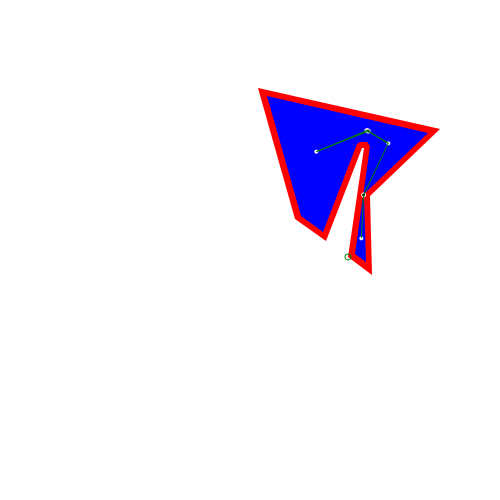

In [177]:
def centre_in_poly(poly):
    i=0
    pc=PyclipperOffset()
    pc.AddPath(subj,JT_SQUARE,ET_CLOSEDPOLYGON)
    soln=pc.Execute(i)
    while soln :
        i=i-1
        if len(soln)==1:
            if is_convex_poly(soln):
                break
        soln=pc.Execute(i)
    soln=pc.Execute(i+1)
    if len(soln)>1:
        raise ValueError
    #return centroid
    return tuple(sum(i)/len(i) for i in zip(*pc.Execute(i+1)[0]))

def is_convex_vtx(*vertextriplet):
    a,b,c=vertextriplet
    e1=(b[0]-a[0],b[1]-a[1])
    e2=(c[0]-b[0],c[1]-b[1])
    cross=e1[0]*e2[1]-e1[1]*e2[0]
    if cross > 0:
        return True
    else:
        return False
def is_convex_poly(poly):
    convex=True
    l=len(poly[0])
    for idx in range(l):
        convex = convex and is_convex_vtx(poly[0][(idx-1)%l],poly[0][idx],poly[0][(idx+1)%l])
    return convex

def concave_vertices(poly):
    l=len(poly[0])
    for idx in range(l):
        if not is_convex_vtx(poly[0][(idx-1)%l],poly[0][idx],poly[0][(idx+1)%l]):
            yield(idx)
    
def smallest_single_poly(poly):
    i=0
    pc=PyclipperOffset()
    pc.AddPath(subj,JT_SQUARE,ET_CLOSEDPOLYGON)
    soln=pc.Execute(i)
    while len(soln)==1:
        i=i-1
        soln=pc.Execute(i)
    return pc.Execute(i+1)

def line_of_sight(pt1,pt2,poly):
    def edges(poly):
        l=len(poly)
        for i in range(l):
            yield (poly[i],poly[(i+1)%l])

    for edge in edges(poly):
        if intersect(pt1,pt2,edge[0],edge[1]):
            return False
    return True

def centroids(poly):
    offset=0
    pc=PyclipperOffset()
    pc.AddPath(subj,JT_SQUARE,ET_CLOSEDPOLYGON)
    soln=pc.Execute(0)
    while soln:
        for idx,s in enumerate(soln):
            popped=False
            if is_convex_poly([s]):
                yield tuple(sum(i)/len(i) for i in zip(*s))
                soln.pop(idx)
                popped=True
        if len(soln)==0:
            break
        if popped:
            pc.Clear()
            pc.AddPaths(soln,JT_SQUARE,ET_CLOSEDPOLYGON)
            offset=-1
        else:
            offset-=1
        soln=pc.Execute(offset)
def pinchpoints(poly):
    for v in concave_vertices([poly]):
        #midpoint of a line drawn from the vertex to nearest edge

        midpoint=(Vec2D(*poly[(v-1)%len(poly)])+Vec2D(*poly[(v+1)%len(poly)]))*0.5
        vv=Vec2D(*poly[v])
        ray=vv+(-1)*midpoint
        
        #extend this line as long as it takes.
        def intersects(p1,p2,q1,q2):
            if min(p1[0],p2[0])<max(q1[0],q2[0]) and max(p1[0],p2[0])>min(q1[0],q2[0]) and min(p2[1],p1[1])<max(q1[1],q2[1]) and max(p1[1],p2[1])>min(q1[1],q2[1]):
                return True
            return False
        def edges(poly):
            l=len(poly)
            for i in range(l):
                yield (poly[i],poly[(i+1)%l])
        #y=m(x-x0)+y0
        #y
        p2=vv+ray
        intersections=[]
        while not intersections:
            for edge in edges(poly):
                if intersects(*edge,vv.car,p2.car):
                    #l1=edge[0]+b*(edge[1]-edge[0])
                    #l2=vv+a*ray
                    #vv+a*ray=edge[0]+b*(edge[1]-edge[0])
                    #a*ray=(edge[0]-vv)+b*edge[1]
                    #a*ray x edge[1] = (edge[0]-vv) x edge[1]
                    e1=Vec2D(*edge[1])
                    e0=Vec2D(*edge[0])
                    dedge=e1+(-1)*e0
                    a = (e0+(-1)*vv).cross(dedge) / ray.cross(dedge)
                    if a>0:
                        ipt=vv+a*ray
                        intersections.append(ipt)
            ray=1.5*ray
        #print(tuple((i.r,i) for i in intersections),'\n')
        nearest_wall=max((i.r,i) for i in intersections)[1]
        yield (0.5*(vv+nearest_wall)).car
        #yield tuple(wall[1].car for wall in walls)

smallest_single=smallest_single_poly(subj)
dwg=svgwrite.Drawing(size=(500,500))
dwg.add(dwg.polygon(subj,fill='red'))
dwg.add(dwg.circle(subj[0],r=3,fill='none',stroke='green'))
for s in smallest_single:
    dwg.add(dwg.polygon(s,fill='blue'))
for c in centroids(subj):
    dwg.add(dwg.circle(c,r=2,fill='white'))
for p in pinchpoints(subj):
    dwg.add(dwg.circle(p,r=2,fill='black',stroke='white'))


def graph(poly):
    pp=list(pinchpoints(poly))
    cp=list(centroids(poly))
    #nodes=pp+cp
    #edges=[]

    nodes=pp+cp
    for idx,n in enumerate(nodes):#connect centroids to pinchpoints
        smallest=smallest_single_poly(poly)
        for p in nodes[idx+1:]:
            if line_of_sight(n,p,smallest[0]):
                yield(n,p)
def nearest(pt,points,poly):
    def dist(a,b):
        return (Vec2D(*a)+(-1)*Vec2D(*b))
    return min((dist(pt,p2),p2) if line_of_sight(pt,p2,poly) for p2 in points)[1]

def path(fr,to,poly):
    cent=list(centroids(poly))
    fr_nearest_centroid=nearest(fr,cent,poly)
    to_nearest_centroid=nearest(to,cent,poly)
    
for a,b in graph(subj):
    dwg.add(dwg.line(a,b,stroke='green',stroke_width=1))
SVG(dwg.tostring())

In [167]:
c=list(centroids(subj))
p=list(pinchpoints(subj))
def line_of_sight(pt1,pt2,poly):
    def edges(poly):
        l=len(poly)
        for i in range(l):
            yield (poly[i],poly[(i+1)%l])

    for edge in edges(poly):
        if intersect(pt1,pt2,edge[0],edge[1]):
            return False
    return True

line_of_sight(c[0],subj[0],subj)


True

In [164]:
#http://www.geeksforgeeks.org/check-if-two-given-line-segments-intersect/
'''bool onSegment(Point p, Point q, Point r)
{
    if (q.x <= max(p.x, r.x) && q.x >= min(p.x, r.x) &&
        q.y <= max(p.y, r.y) && q.y >= min(p.y, r.y))
       return true;
 
    return false;
}
'''
def on_segment(p,q,r):
    return q[0]<=max(p[0],r[0]) and q[0]>=min(p[0],r[0]) and q[1]<=max(p[1],r[1]) and q[1]>=min(p[1],r[1])


'''// To find orientation of ordered triplet (p, q, r).
// The function returns following values
// 0 --> p, q and r are colinear
// 1 --> Clockwise
// 2 --> Counterclockwise
int orientation(Point p, Point q, Point r)
{
    // See 10th slides from following link for derivation of the formula
    // http://www.dcs.gla.ac.uk/~pat/52233/slides/Geometry1x1.pdf
    int val = (q.y - p.y) * (r.x - q.x) -
              (q.x - p.x) * (r.y - q.y);
 
    if (val == 0) return 0;  // colinear
 
    return (val > 0)? 1: 2; // clock or counterclock wise
}
'''
def orientation(p,q,r):
    #cross product.
    Y=1
    X=0
    val = (q[Y]-p[Y])*(r[X]-q[X]) -(q[X]-p[X])*(r[Y]-q[Y])
    
    if val==0:
        return 'colinear'
    elif val>0:
        return 'clockwise'
    return 'counterclockwise'

'''// The main function that returns true if line segment 'p1q1'
// and 'p2q2' intersect.
bool doIntersect(Point p1, Point q1, Point p2, Point q2)
{
    // Find the four orientations needed for general and
    // special cases
    int o1 = orientation(p1, q1, p2);
    int o2 = orientation(p1, q1, q2);
    int o3 = orientation(p2, q2, p1);
    int o4 = orientation(p2, q2, q1);
 
    // General case
    if (o1 != o2 && o3 != o4)
        return true;
 
    // Special Cases
    // p1, q1 and p2 are colinear and p2 lies on segment p1q1
    if (o1 == 0 && onSegment(p1, p2, q1)) return true;
 
    // p1, q1 and p2 are colinear and q2 lies on segment p1q1
    if (o2 == 0 && onSegment(p1, q2, q1)) return true;
 
    // p2, q2 and p1 are colinear and p1 lies on segment p2q2
    if (o3 == 0 && onSegment(p2, p1, q2)) return true;
 
     // p2, q2 and q1 are colinear and q1 lies on segment p2q2
    if (o4 == 0 && onSegment(p2, q1, q2)) return true;
 
    return false; // Doesn't fall in any of the above cases
}'''
def intersect(p1,q1,p2,q2):
    o1=orientation(p1,q1,p2)
    o2=orientation(p1,q1,q2)
    o3=orientation(p2,q2,p1)
    o4=orientation(p2,q2,q1)
    for o in (o1,o2,o3,o4):
        if o=='colinear': return False
    if o1!=o2 and o3!=o4: return True
    #i actually want this to return false if they're colinear
    '''if o1=='colinear' and on_segment(p1,p2,q1): return True
    if o2=='colinear' and on_segment(p1,q2,q1): return True
    if o3=='colinear' and on_segment(p2,p1,q2): return True
    if o4=='colinear' and on_segment(p2,q1,q2): return True'''
    return False

In [166]:
intersect((0,0),(10,10),(0,5),(5.1,5))

True

In [163]:
p1=(0,0)
q1=(10,10)
p2=(0,5)
q2=(5,5)

o1=orientation(p1,q1,p2)
o2=orientation(p1,q1,q2)
o3=orientation(p2,q2,p1)
o4=orientation(p2,q2,q1)
o1,o2,o3,o4

('counterclockwise', 'colinear', 'clockwise', 'counterclockwise')